In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from saxs_data_processing import io, manipulate, target_comparison, subtract
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import pandas as pd
from sklearn import metrics

## User parameter setup

List of all background files to use. Data loading function will find associated data files in the same directory as backgrounds.

In [3]:
background_fps = ['/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_05_StoberRandomCampaignV2/03210_B9-T1_Ethanol_background__000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_07_randomcampaignV3/data/03218_D1-T1_Ethanol_background_1_000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_11_randomV3_round2/03289_H6-T2_EtOH_background_1_000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_15_Highlights_replicates/03357_D5-T2_Background_1_EtOH_000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_17_randomBaselineV4/data/03439_C1-T2_EtOH_1_000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_11_05_optimizationRound1/03533_F9-T1_Ethanol_background_1_000.dat']

Select q ranges. Right now this relies on manual q range selection to a certain extent. We subtract background and fit the spline on a larger q-range, then evaluate the spline on a subset of the larger q range to avoid spline edge effects.

In [4]:
# q range to consider up to and including spline fit step
q_min_subtract = 0.002
q_max_subtract = 0.035

# q range to interpolate spline fit on and perform distance metric calculation with
q_min_spl = 0.003
q_max_spl = 0.03
n_interpolate_gridpts = 1024 # number of grid points to interpolate q on.

Select target particle parameters. Target is spherical particles with radius r and polydispersity pdi

In [5]:
target_r_nm = 60
target_r_angs = target_r_nm*10
target_pdi = 0.08
sld_silica = 8.575
sld_etoh = 9.611

Set processing and optimization parameters for distance calculation

In [6]:
# SavGol denoise filter parameters
savgol_n = 15
savgol_order = 3
# minimum data length - data with less than ~100 data points is due to valid data selection step in subtraction and is likley too noisy to do anything with.
min_data_len = 100

# spline fit parameters
s = 0.05
k = 3

#scale parameters
n_avg = 100

# Amplitude-phase distance parameters
optim = "DP"
grid_dim = 10

## ######################## STOP: Don't touch anything below here \#############################


## Load data

In [7]:
sample_data, uuid2bkg = io.load_biocube_data_with_background(background_fps, 24)

/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/io.py:150: UserWarning: Duplicate UUID found for b8953350-d5ad-4c99-b929-ebfe8febd0df. Check your file naming
  warnings.warn(
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/io.py:150: UserWarning: Duplicate UUID found for ea0d2ca6-8818-45f8-b5e3-04858133284a. Check your file naming
  warnings.warn(
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/io.py:150: UserWarning: Duplicate UUID found for 0ec4dd81-7487-4689-96b9-b0f646a2047d. Check your file naming
  warnings.warn(


## Calculate target scattering

In [8]:
q_grid = np.linspace(np.log10(q_min_spl), np.log10(q_max_spl), n_interpolate_gridpts)

q_grid_nonlog = 10**q_grid
target_I = target_comparison.target_intensities(q_grid_nonlog, target_r_angs, target_pdi, sld_silica, sld_etoh)
target_I = np.log10(target_I)

## Calculate RMSE for comparison

In [93]:
processing_dataset_rmse = {}
exceptions = []
for uuid_val, data_val in sample_data.items():
   
    data_val = sample_data[uuid_val]
    meas_entry = {}
    meas_entry['original_data'] = data_val[0]
    background = uuid2bkg[uuid_val]
    meas_entry['background'] = background[0]
    # 1. Subtract background and select q range
    subtracted = subtract.chop_subtract(data_val[0], background[0], hiq_thresh=1)
    
    if subtracted is None:
        # if subtract returned None, data has issues and we are done with this sample
        meas_entry['status'] = 'failed'
        meas_entry['failure_point'] = 'background_subtraction'
        processing_dataset_rmse[uuid_val] = meas_entry
        print(f'Sample {uuid_val} failed at background subtraction')
        continue
        
    else:
        # q range selection
        subtracted = subtracted[subtracted['q'] < q_max_subtract]
        subtracted = subtracted[~subtracted['I'].isna()]
        subtracted = subtracted[subtracted['I'] > 0] # drop negative values 
        # screen on dataset length
        if len(subtracted) < min_data_len:
            meas_entry['status'] = 'failed'
            meas_entry['failure_point'] = 'subtracted_data_length'
            processing_dataset_rmse[uuid_val] = meas_entry
            print(f'Sample {uuid_val} failed due to data length')
            continue
        else:
            meas_entry['subtracted_clipped'] = subtracted
            meas_entry['status'] = 'valid'
            processing_dataset_rmse[uuid_val] = meas_entry
    
    
    # 2. Convert everything into log10 space
    q_log = np.log10(subtracted['q'].to_numpy())
    I_log = np.log10(subtracted['I'].to_numpy())

    
    
    meas_entry['q_log'] = q_log
    meas_entry['I_log'] = I_log
    
    # 3. denoise filter on intensity
    
    I_savgol = manipulate.denoise_intensity(I_log, savgol_n = savgol_n, savgol_order = savgol_order)
    
    meas_entry['I_savgol'] = I_savgol
    
    # 4. Spline fit and interpolate
    I_spline = manipulate.fit_interpolate_spline(q_log, I_savgol, q_grid, s = s, k = k)
    
    meas_entry['I_spline'] = I_spline
    
    # 5. scale onto target
    I_scaled = manipulate.scale_intensity_highqavg(I_spline, target_I, n_avg = n_avg)
    
    meas_entry['I_scaled'] = I_scaled
    
    #6. Calculate AP distance
    try:
        distance = metrics.root_mean_squared_error(I_scaled, target_I)
    except:
        exceptions.append(uuid_val)
        continue
    meas_entry['rmse_distance'] = distance

    
    processing_dataset_rmse[uuid_val] = meas_entry


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src

Sample d03dab18-5712-44f7-9334-14047212632e failed due to data length
Sample 4d5fd07b-987b-49df-b4ba-54d2a337d945 failed due to data length
1.0032446657458967
0.38497799799584187
79
Sample 657e707f-abc9-4f86-ae1e-9e59efb6e1f9 failed due to data length
1.249238472215957
0.5377320753723704
40
0.9928455721578638
0.8621986932719135
79
0.9619906658420294
0.3468728678941788
79
Sample ff3ac045-3c39-4fb0-b2c9-bf69d7600548 failed due to data length
Sample 5452fa4a-b64c-46d7-ace2-bf1b31afc3b3 failed due to data length
-1.2683197059430367
-1.5598130791994098
561
Sample 649ddf37-37fe-4a30-896b-010286133a28 failed due to data length
0.9661000734202229
0.3584534247355977
79
Sample f2e85141-9985-49ff-a6bc-17e2ecbcdc8b failed due to data length
0.6969686350324261
0.666878831503106
149
1.1722183208793633
0.8671341749543615
40
0.9780835054593027
0.9220678614379869
79
Sample d0e19177-de83-4147-ad9f-8c5e3a0aeedd failed due to data length
Sample bfcf29cb-db74-40a1-9d27-911985c3f28f failed due to data lengt

/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src

### Sanity check subtraction

/tmp/ipykernel_39743/2291027841.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


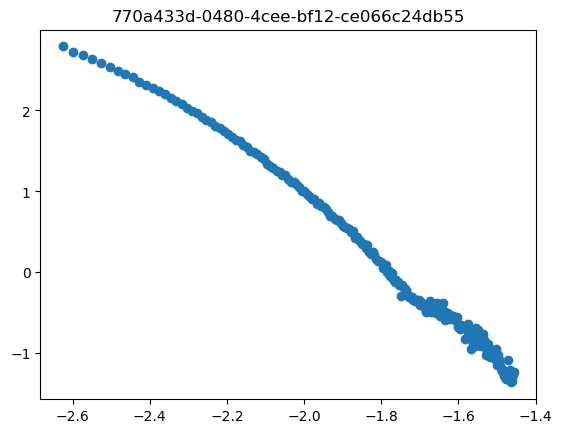

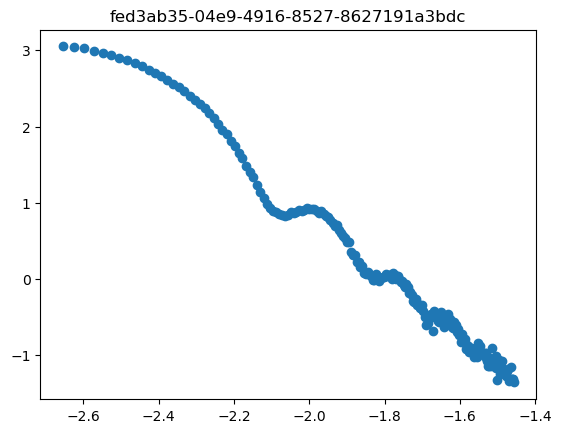

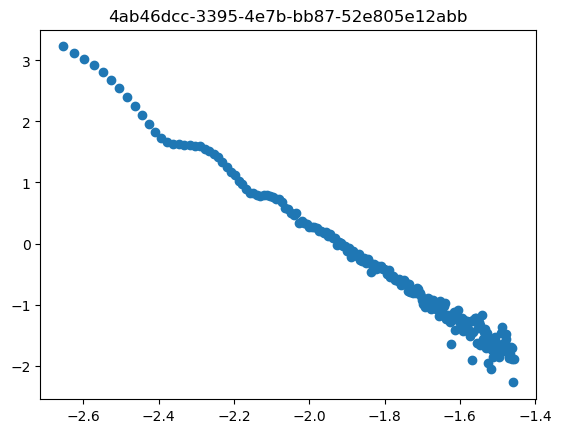

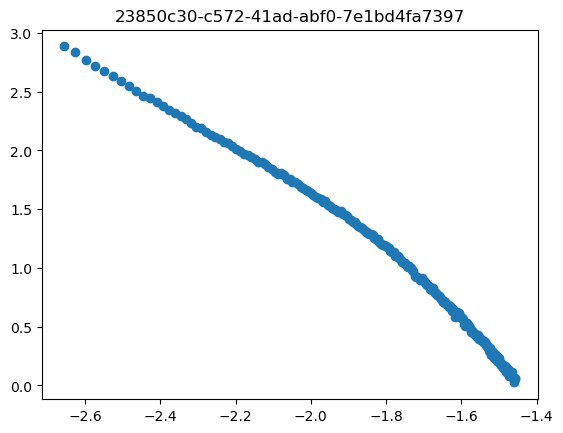

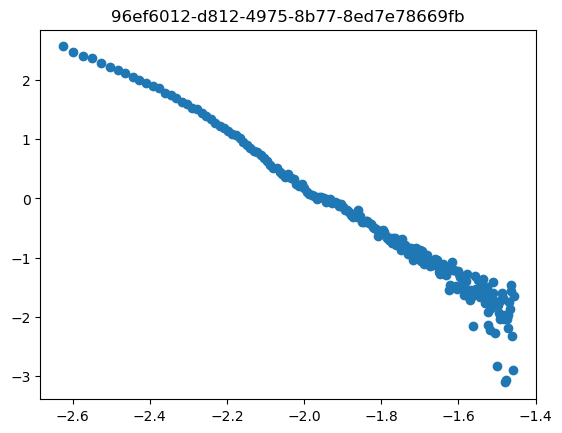

...

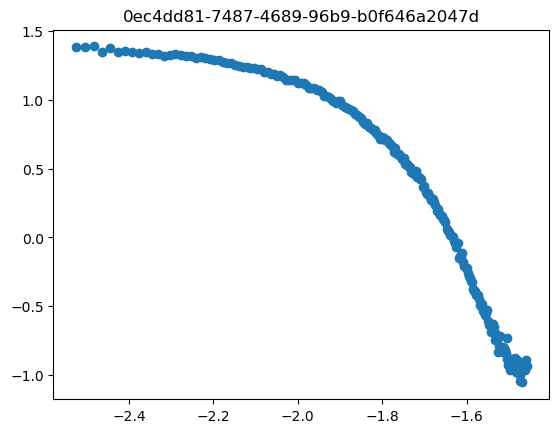

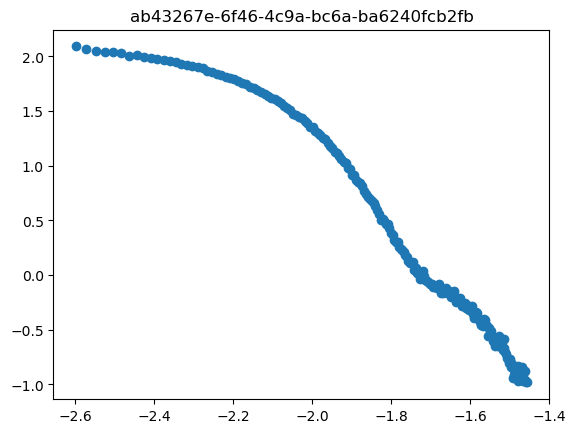

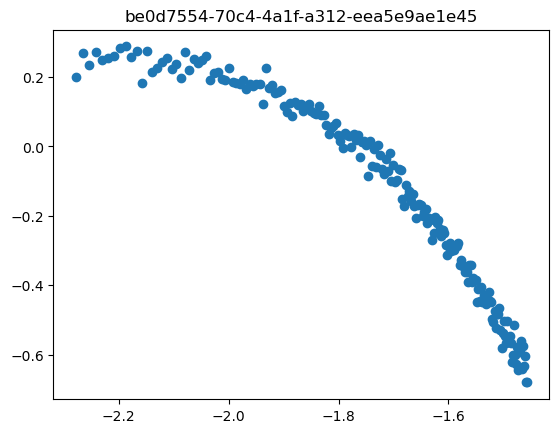

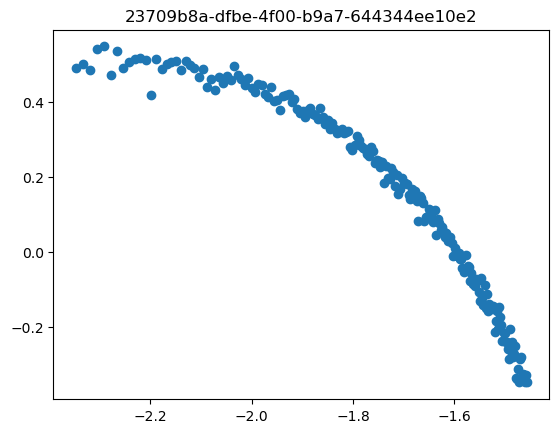

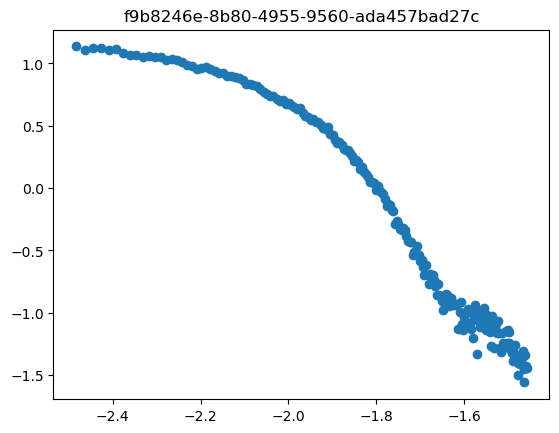

In [94]:
for uuid_val, entry in processing_dataset_rmse.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()
    
        I_subtracted = entry['I_log']
        q = entry['q_log']
    
        ax.scatter(q, I_subtracted)
        ax.set_title(uuid_val)

## Sanity check spline fit

/tmp/ipykernel_39743/1766209320.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


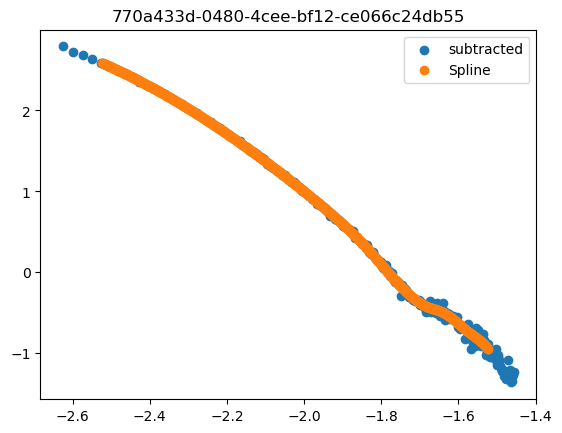

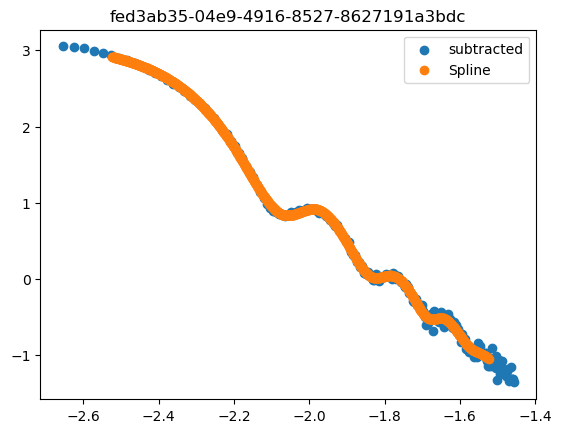

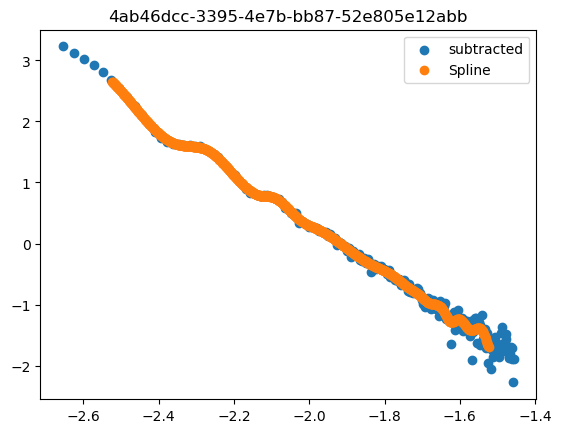

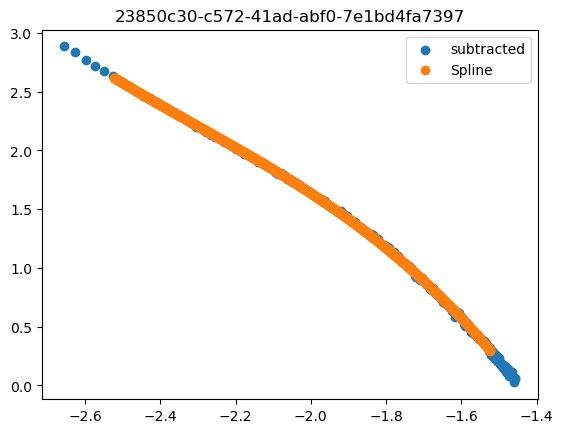

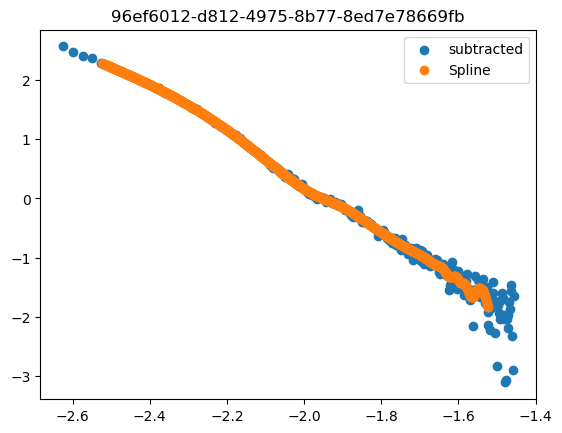

...

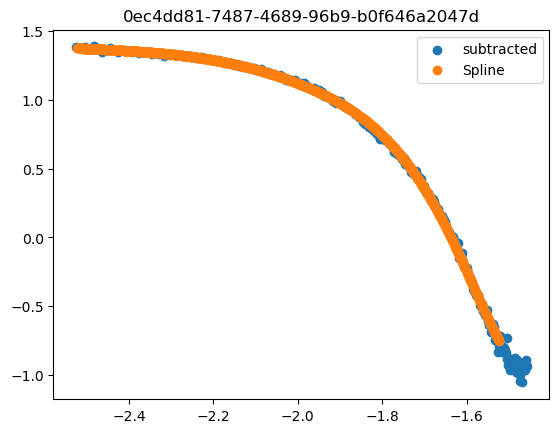

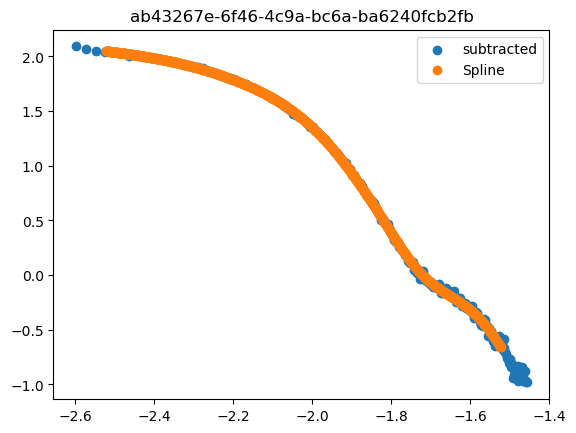

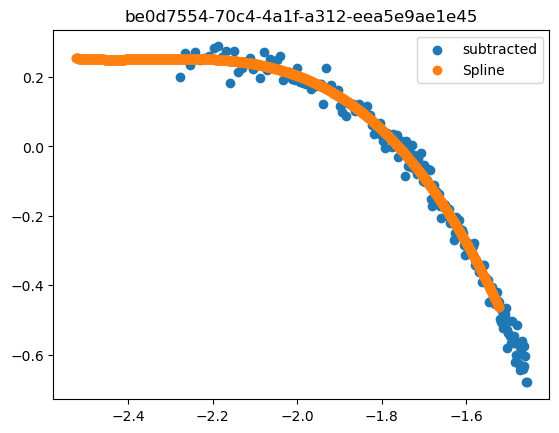

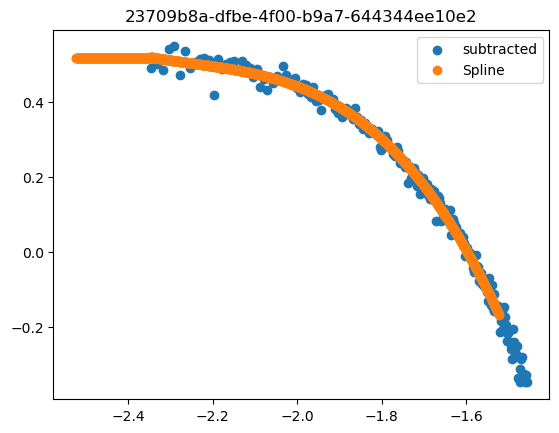

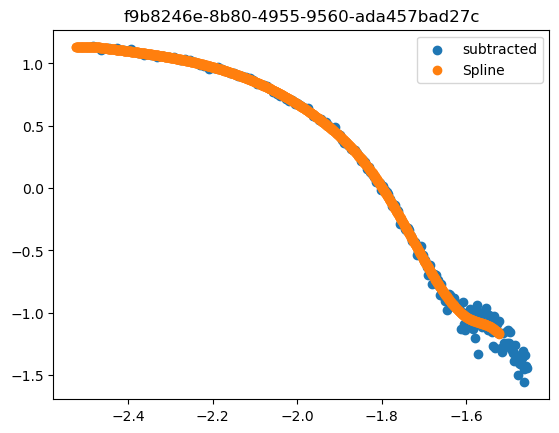

In [95]:
for uuid_val, entry in processing_dataset_rmse.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()
    
        I_subtracted = entry['I_log']
        q = entry['q_log']

        I_spline = entry['I_spline']
        
    
        ax.scatter(q, I_subtracted, label = 'subtracted')
        ax.scatter(q_grid, I_spline, label = 'Spline')
        ax.legend()
        ax.set_title(uuid_val)

## Sanity check scaling

/tmp/ipykernel_39743/4114302560.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


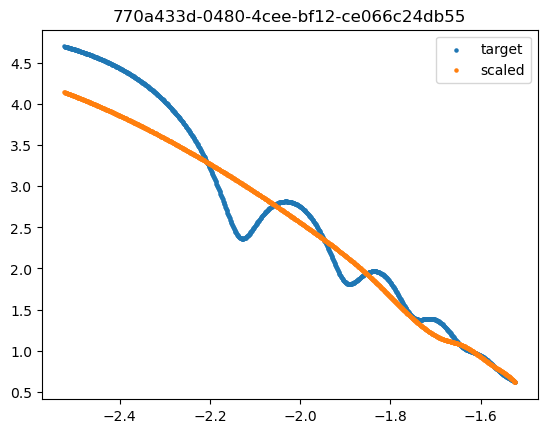

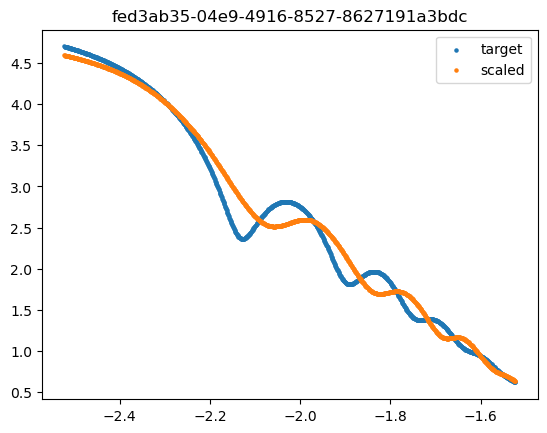

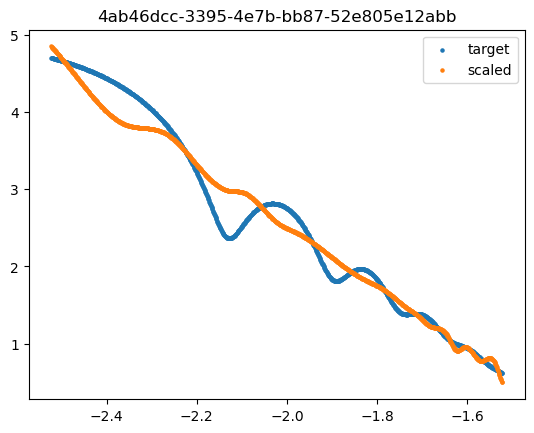

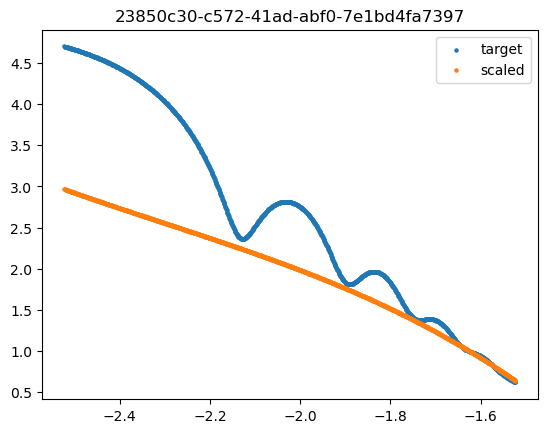

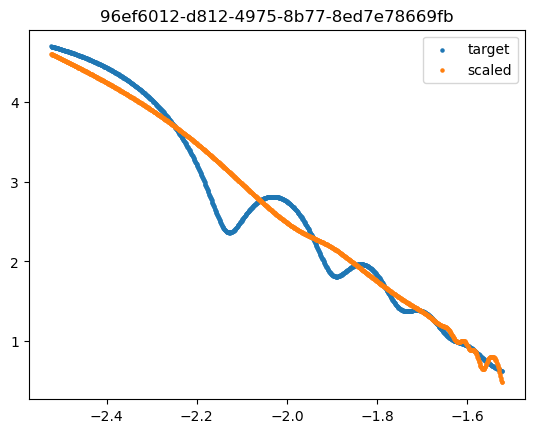

...

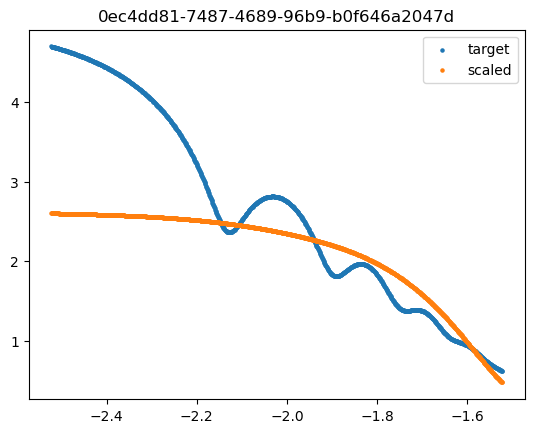

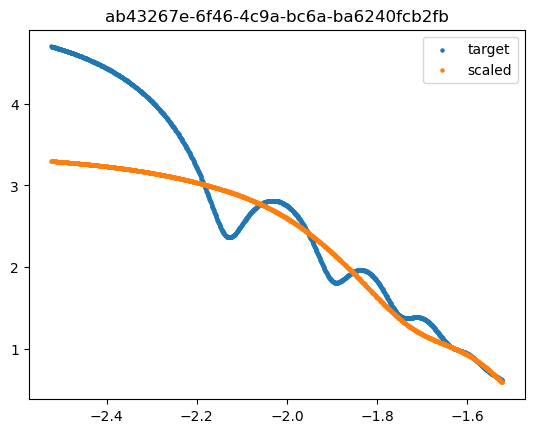

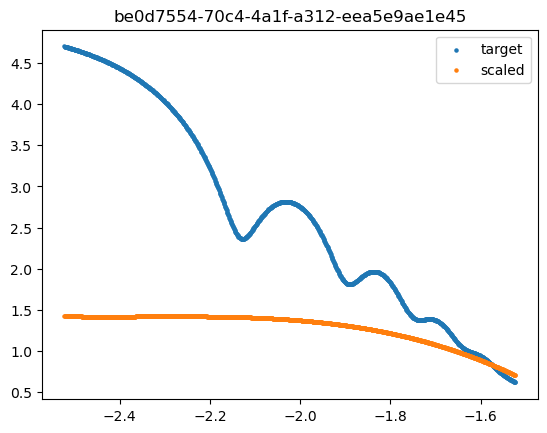

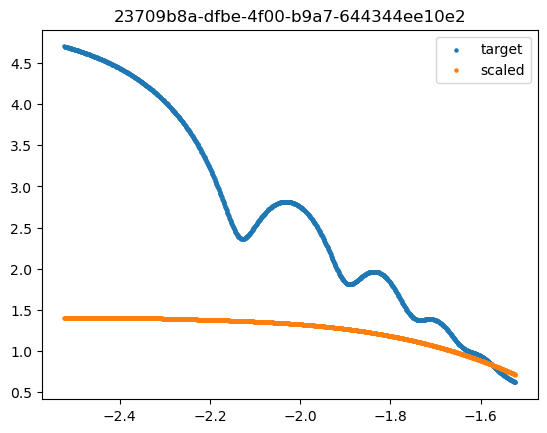

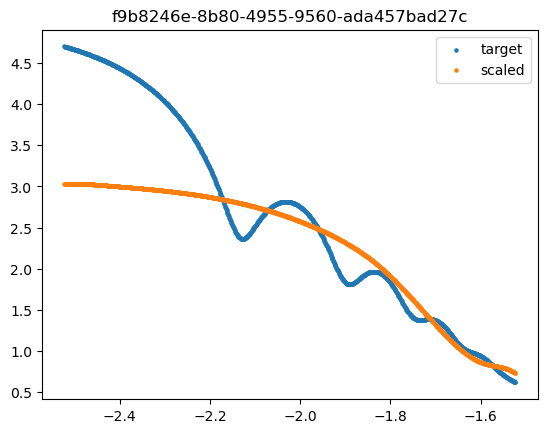

In [96]:
for uuid_val, entry in processing_dataset_rmse.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()


        I_scaled = entry['I_scaled']
        
    
        ax.scatter(q_grid, target_I, label = 'target', s = 5)
        ax.scatter(q_grid, I_scaled, label = 'scaled', s = 5)
        ax.legend()
        ax.set_title(uuid_val)

## Plot RMSE ranked for comparison

In [97]:
rmse_dist = {}
for uuid_val, entry in processing_dataset_rmse.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        try:
            rmse_dist[uuid_val] = entry['rmse_distance']
        except:
            continue


uuids = np.array(list(rmse_dist.keys()))
rmses = list(rmse_dist.values())
uuid_sorted_rmse = uuids[np.argsort(rmses)]

In [98]:

with PdfPages('ranked_rmse_dist_results.pdf') as pdf:
    for i, uuid_val in enumerate(uuid_sorted_rmse):
    
        entry  = processing_dataset_rmse[uuid_val]
        I_scaled = entry['I_scaled']
        
        distance = rmse_dist[uuid_val]
        
        fig, ax = plt.subplots()
        ax.loglog(10**q_grid, 10**target_I)
        ax.loglog(10**q_grid, 10**I_scaled)
        ax.set_title(uuid_val)
        ax.text(0.1, 0.05, f'Rank: {i}, RMSE distance: {distance}', transform = ax.transAxes)
        ax.set_xlabel('q [1/A]')
        pdf.savefig()
        plt.close()

In [15]:
np.min(I_savgol)

-1.4550031001921906

In [16]:
np.max(I_savgol)

1.1286926800637729

In [99]:
processing_dataset_rmse['a6ee3a08-02cd-4703-9d6c-3721dad590c8']

{'original_data':             q             I          sig
 0    0.000076  9.023793e+06  1978.310009
 1    0.000229  8.430744e+06  1352.127805
 2    0.000382  7.020598e+06   780.372266
 3    0.000535  5.424133e+06   685.930224
 4    0.000688  4.054448e+06   501.206414
 ..        ...           ...          ...
 900  0.137607  0.000000e+00     0.201118
 901  0.137760  0.000000e+00     0.156426
 902  0.137913  0.000000e+00     0.234640
 903  0.138066  0.000000e+00     0.469281
 904  0.138219  0.000000e+00     0.469283
 
 [905 rows x 3 columns],
 'background':             q             I          sig
 0    0.000076  9.279254e+06  2031.996565
 1    0.000229  8.654451e+06  1387.622024
 2    0.000382  7.190303e+06   799.935612
 3    0.000535  5.507749e+06   700.113609
 4    0.000688  4.121778e+06   521.262970
 ..        ...           ...          ...
 900  0.137607  0.000000e+00     0.186223
 901  0.137760  0.000000e+00     0.212827
 902  0.137913  2.971308e-01     0.257335
 903  0.138066  0.

In [35]:
uuid_val = '5edc0763-1f2c-44f2-bf68-db785ae258b0'

In [36]:
I_savgol = processing_dataset_rmse[uuid_val]['I_savgol']
I_log = processing_dataset_rmse[uuid_val]['I_log']
q = processing_dataset_rmse[uuid_val]['q_log']

In [37]:
from scipy.interpolate import BSpline, splrep
from scipy.signal import savgol_filter

In [62]:
spl = BSpline(*splrep(q, I_savgol, s=s, k=k))
I_spline = spl(q_grid)

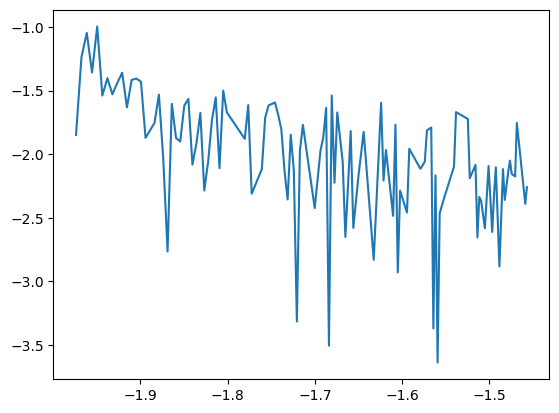

In [63]:
plt.plot(q, I_log)

In [64]:
def clip_spline_extrapolation(q_original, I_original, q_grid, I_spline, n_window = 50):
    """
    Clip spline fit blow-ups in hi-q extrapolation range. For spline extrapolation q range, if I_spline is outside max/min of I_original in last n_window q points, set to max/min seen in window. 
    """
    # check that q_grid is greater than q_original
    if q_original[-1] > q_grid[-1]:
        return I_spline
    else:
        q_grid_og_max_ind = np.where(q_grid > q_original[-1])[0][0]
        window_max = np.max(I_original[-n_window:])
        window_min = np.min(I_original[-n_window:])
        
        
        I_spline_extrap = I_spline[q_grid_og_max_ind:]
        
        I_spline_extrap[np.where(I_spline_extrap > window_max)] = window_max
        I_spline_extrap[np.where(I_spline_extrap < window_min)] = window_min
        
        I_spline_clip = I_spline
        I_spline_clip[q_grid_og_max_ind:] = I_spline_extrap

        return I_spline_clip

In [87]:
def clip_spline_extrapolation_lowq(q_original, I_original, q_grid, I_spline, n_window = 10):
    """
    Clip spline fit blow-ups in hi-q extrapolation range. For spline extrapolation q range, if I_spline is outside max/min of I_original in last n_window q points, set to max/min seen in window. 
    """
    # check that q_grid is greater than q_original
    if q_original[0] < q_grid[0]:
        return I_spline
    else:
        q_grid_og_min_ind = np.where(q_grid < q_original[0])[0][-1]
        window_max = np.max(I_original[:n_window])
        window_min = np.min(I_original[:n_window])

        print(window_max)
        print(window_min)
        print(q_grid_og_min_ind)
        I_spline_extrap = I_spline[:q_grid_og_min_ind]
        
        I_spline_extrap[np.where(I_spline_extrap > window_max)] = window_max
        I_spline_extrap[np.where(I_spline_extrap < window_min)] = window_min
        
        I_spline_clip = I_spline
        I_spline_clip[:q_grid_og_min_ind] = I_spline_extrap

        return I_spline_clip

In [91]:
I_spline_clip = clip_spline_extrapolation_lowq(q, I_savgol, q_grid, I_spline)
I_spline_clip = clip_spline_extrapolation(q, I_savgol, q_grid, I_spline_clip, n_window = 50)

-1.2683197059430367
-1.5598130791994098
561


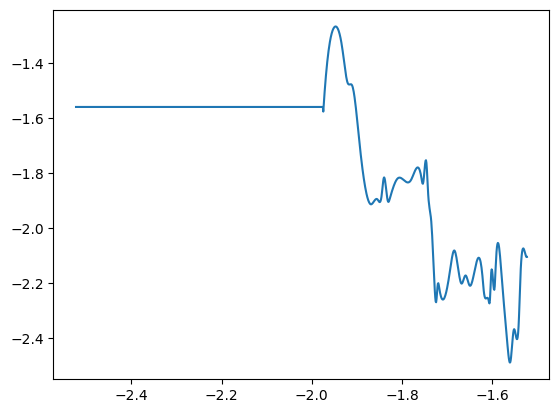

In [92]:
plt.plot(q_grid, I_spline_clip)

In [75]:
q[0]

-1.9738574513633214

In [21]:
n_pts = 20

I_original_runningavg = np.convolve(I_savgol, np.ones(n_pts)/n_pts, mode = 'same')

In [24]:
I_original = I_savgol

#I_spline[np.where(I_spline > 1.5*np.max(I_original))] = 1.5*np.max(I_original)
#I_spline[np.where(I_spline < 1.5*np.min(I_original))] = 1.5 * np.min(I_original)


I_max = 1.5*np.max(I_original)
I_min = 1.5*np.min(I_original)

I_spline[np.where(I_spline[:100] > I_max)] = I_max

#I_spline_exrap = I_spline(np.where(q_grid

I_spline_mod = I_spline[n_q:]

I_original_last = I_original_runningavg[-1]

I_spline_mod[np.where(I_spline_mod < I_min)] = I_original_last
#print(I_spline_mod)
I_spline_mod[np.where(I_spline_mod > I_original_last)] = I_original_last
I_spline[n_q: ] = I_spline_mod

NameError: name 'n_q' is not defined

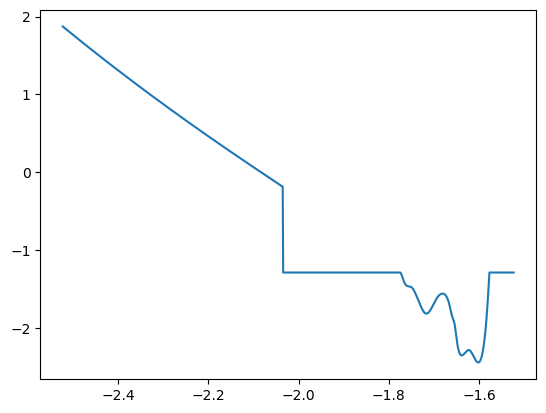

In [130]:
plt.plot(q_grid, I_spline)

In [99]:
q_grid[n_q]

-2.034120192005655

In [60]:
1.5*np.max(I_original)

3.175845393594763

In [61]:
1.5 * np.min(I_original)

-3.691641818128352

In [62]:
I_spline

array([3.17584539, 3.17584539, 3.17584539, ..., 3.17584539, 3.17584539,
       3.17584539])